In [1]:
import matplotlib.pyplot as plt
from scipy import signal
from scipy.io import wavfile
import os
import IPython
import math
import numpy as np
from scipy.signal import medfilt
import sympy
from scipy.sparse import csc_matrix,lil_matrix
import librosa.core as lc
sympy.init_printing()
import IPython.display as ipd
import scipy
import soundfile as sf


In [2]:
base_dir="AudioFiles"
file_name="há gente aqui_RED.wav"

# Interpolation of missing samples

Há gente aqui

In [3]:
file_path = os.path.join(base_dir,file_name)
sample_rate,samples = wavfile.read(file_path)
time = np.arange(samples.shape[0])/sample_rate
IPython.display.Audio(samples,rate=sample_rate)
samples_vector = samples.reshape((samples.shape[0],1))

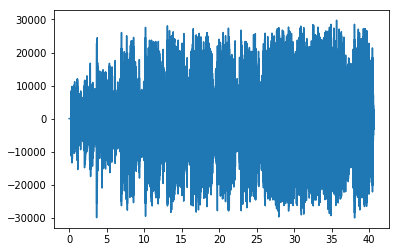

40.596757369614515


In [4]:
plt.plot(time,samples_vector)
plt.show()

print(max(time))

In [5]:
median_filtered = medfilt(samples,kernel_size=33)
IPython.display.Audio(median_filtered,rate=sample_rate)

In [6]:
def get_X(x,I):
    """
    construct X matrix for autoregressive model as defined in page 34 of
    the thesis
    """
    x_extended = np.zeros([x.shape[0],I])
    X = np.zeros((x.shape[0]-I,I))
    for i in range(I):
        #define selector for each line
        X[:,i] = x[I-i-1:(x.shape[0] -1 - i),0].reshape([x[I-i-1:(x.shape[0] -1 - i),0].shape[0]])
    return X

In [7]:
def autoregressive_matrix(x,I):
    """
    Calculate autoregressive model of I coefficients from signal x using LS method
    to minimize the prediction error energy
    """
    X = get_X(x,I)
    X_t = np.transpose(X)
    x_i = x[I:]
    a = np.matmul(X_t,X)
    b = np.linalg.pinv(a)
    c = np.matmul(b,X_t)
    a_ls = np.matmul(c,x_i)
    return a_ls

In [8]:
#to be removed - noise detection
def get_A(a,K):
    """
    construct A matrix as defined in page 124 of the thesis.
    """
    I = a.shape[0]
    A = np.zeros([K-I,K])
    for i in range(K-I):
        A[i,i:i+I] = -1*np.flip(np.transpose(a),axis=1)
        A[i,i+I] = 1
    return A


In [9]:
def ls_interpolation(A_d,A_c,x_c):
    """
    LS interpolation as defined in page 113 of the thesis
    """
    A_d_t = np.transpose(A_d)
    x_d = -1*np.matmul(np.matmul(np.matmul(np.linalg.inv(np.matmul(A_d_t,A_d)),A_d_t),A_c),x_c)
    return x_d

In [38]:
noise_start = 300000
missing_samples = 10

incomplete_x = samples_vector.copy()
incomplete_x[noise_start:noise_start + missing_samples,:] *= 0

plt.plot(time[noise_start-1000:noise_start+5000],incomplete_x[noise_start-1000:noise_start+5000,0])
IPython.display.Audio(incomplete_x[:,0],rate=sample_rate)


In [39]:
#values taken from page 130
#autoregressive model order
I = 100

#window used for LS interpolation
window_length=0.1 
#amount of samples in model window
window_samples=int(window_length*sample_rate)
#noise_start in complete audio
noise_start = 300000
windowstart = int(noise_start - window_samples/2)
windowend = int(noise_start + window_samples/2)
#we put the noise exactly in the middle of the window used for the autoregressive model
window = incomplete_x[windowstart:windowend]
a = autoregressive_matrix(window,I)


K=samples_vector.shape[0]
A = get_A(a,window_samples)

In [40]:
#noise start index in window
noise_start = int(window_samples/2)
noise_end = noise_start + missing_samples

#construct A_D,x_d and A_ as described in page 113 of the thesis
A_d = A[:,noise_start:noise_end]
x_d = window[noise_start:noise_end]

known_indexes = np.r_[:noise_start,noise_end:]
A_c = A[:,known_indexes]
x_c = window[known_indexes]

x_d_ls = ls_interpolation(A_d,A_c,x_c)

#noise_start in complete audio
noise_start = 300000

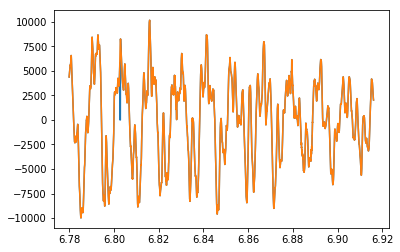

In [41]:

plt.plot(time[noise_start-1000:noise_start+5000],samples_vector[noise_start-1000:noise_start+5000,0])
plt.show()

In [42]:
#samples_vector[noise_start-1000:noise_start+5000,0]
samples[noise_start-1000:noise_start+5000]

array([4370, 4445, 4532, ..., 2119, 2084, 2028], dtype=int16)

In [43]:
IPython.display.Audio(samples_vector[:,0].astype(int),rate=sample_rate)



In [44]:
reconstructed_x = incomplete_x.copy()
#replace missing samples with x_ls
reconstructed_x[noise_start:noise_start + missing_samples,:] = x_d_ls

In [45]:
IPython.display.Audio(reconstructed_x[:,0].astype(int),rate=sample_rate)

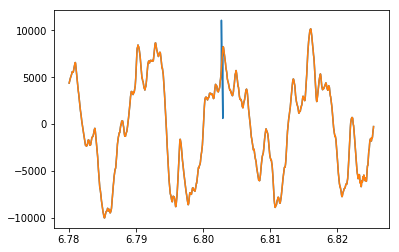

In [46]:
plt.plot(time[noise_start-1000:noise_start+1000],reconstructed_x[noise_start-1000:noise_start+1000,0])
plt.plot(time[noise_start-1000:noise_start+1000],samples_vector[noise_start-1000:noise_start+1000,0])
plt.show()

In [47]:
x_d_ls.shape

In [48]:
print(samples_vector.shape)

(1790318, 1)


/Users/danielmendonca/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:7221: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


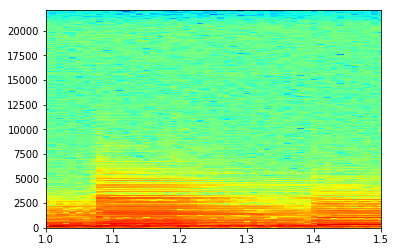

In [49]:
window_length=0.02 #20ms, minimum variation we (humans) can hear
nfft=int(window_length*sample_rate)
plt.specgram(samples, Fs=sample_rate,cmap='jet',NFFT=nfft,noverlap=nfft/2,pad_to=1048)
#plt.ylim(0,5000)
plt.xlim(1,1.5)
plt.show()

In [50]:
wavfile.write(os.path.join(base_dir,'missing'+missing_samples.__str__()+'samples.wav'), sample_rate,incomplete_x)
wavfile.write(os.path.join(base_dir,'missing'+missing_samples.__str__()+'_reconstructed_samples.wav'), sample_rate,reconstructed_x)